In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import somoclu
import os, sys
from tqdm import tqdm
import rasterio
from sklearn.externals import joblib

In [3]:
from scipy import fftpack
from scipy.fftpack import dct, idct
from scipy.ndimage.filters import generic_filter as gf
from scipy import stats
import scipy as sp
from sklearn import decomposition as decomp
from sklearn import neighbors as nn

In [4]:
# Fixing plots
rcParams['image.cmap'] = 'viridis'
rcParams['axes.labelsize'] = 9
rcParams['xtick.labelsize'] = 9
rcParams['ytick.labelsize'] = 9
rcParams['legend.fontsize'] = 9
rcParams['figure.dpi'] = 160
rcParams['savefig.dpi'] = 200

In [5]:
# We use rasterio to read in the tiles since it's faster, but the following line should also 
# work if we were to import gdal...


##test = rasterio.open('Desktop/2cc5efe534a2cbfdac63caefd1d04f7fb43094210f7c4cf2ee355799e2b5c279.tif')

In [6]:
# Index is stored as an hdf file/array in pandas
store = pd.HDFStore('/Users/grigsbye/Desktop/full_wf.h5','r')
conv = store['conv']
store.close()

In [7]:
conv.index[0]

'0000a611a21ce4b4d7a46384354d97ee836d781602a95da52c4d5a4ddd00604e'

In [8]:
# Read in slope data
vel = rasterio.open('/Users/sgrigsby/Downloads/greenland_vel_mosaic250_v1.tif')

In [9]:
X_V, Y_V = np.meshgrid(r_[vel.bounds.left + 125:vel.bounds.right+125:250],
                       r_[vel.bounds.top + 125:vel.bounds.bottom+125:-250])

V_V = vel.read()[0]

# 1j*vel.width
# 1j*vel.height
vel.height, vel.width, vel.bounds

(10920,
 6020,
 BoundingBox(left=-645125.0, bottom=-3370125.0, right=859875.0, top=-640125.0))

In [10]:
#V_V[V_V > 0] = np.log(V_V[V_V > 0])

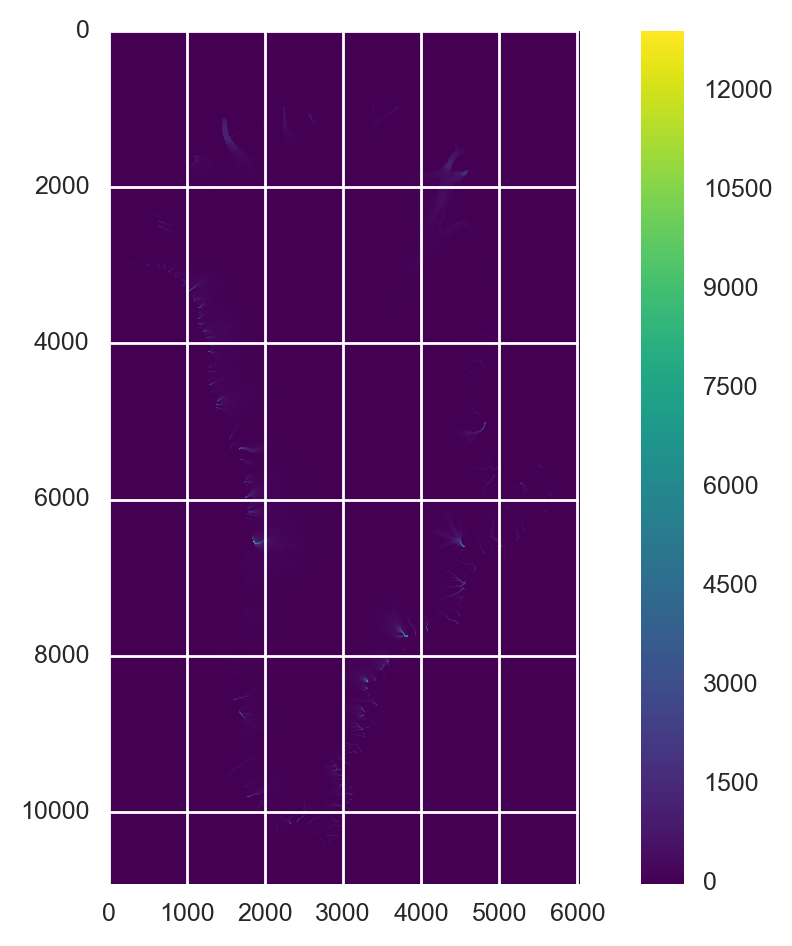

In [11]:
imshow(V_V, vmin=-10)
colorbar()

In [12]:
#Velocity = np.vstack((X_V.ravel(),Y_V.ravel()))

In [13]:
#VTree = nn.BallTree(Velocity.T)

In [15]:
VTree = joblib.load('/Users/sgrigsby/Vel_tree.pkl')

In [16]:
V_V.ravel()[60094172]

260.97974

In [17]:
# Grab 10k tiles to test on...
tiles = 10000
data = np.ones((tiles,40000),dtype=numpy.float32)
coords = np.ones((tiles,2))
for i in tqdm(range(tiles)):
    #temp = gdal.Open('Desktop/all_tiles_april/' + conv.index[i] + '.tif')
    temp = rasterio.open('Desktop/all_tiles_april/' + conv.index[i] + '.tif')
    #tarray = temp.GetRasterBand(1).ReadAsArray()
    data[i,:] = temp.read().ravel()
    coords[i,0] = mean((temp.bounds.left, temp.bounds.right))
    coords[i,1] = mean((temp.bounds.top, temp.bounds.bottom))

100%|██████████| 10000/10000 [00:54<00:00, 182.71it/s]


In [18]:
V_V.ravel()[VTree.query(coords[7412].reshape(1,-1))[1].flatten()][0]

166.84712

In [39]:
np.save('/Volumes/SciPy/coords.npy', coords)

In [19]:
# We are using dct for dimensionality reduction...

In [20]:
a = data[3303,:].reshape(200,200)
#a = np.reshape(test.read().ravel(),(200,200))
def dct2(block):
    return dct(dct(block.T, norm='ortho').T, norm='ortho')

def idct2(block):
    return idct(idct(block.T, norm='ortho').T, norm='ortho')
c = dct2(a)

In [21]:
%time dct2(a)

CPU times: user 729 µs, sys: 166 µs, total: 895 µs
Wall time: 701 µs


array([[  1.09677566e-02,   6.47954712e+01,  -5.93885994e+01, ...,
         -4.09622211e-03,  -1.78833015e-03,   7.41577183e-04],
       [ -4.93507141e+02,   5.10074997e+00,  -3.92081871e+01, ...,
          3.03649897e-04,   5.90515148e-04,  -1.18387220e-02],
       [  1.01680679e+02,   1.55523071e+01,  -5.55836964e+00, ...,
         -8.23974624e-05,  -7.22560892e-03,   5.57403592e-03],
       ..., 
       [ -1.42676467e-02,  -6.33305777e-03,   1.98057778e-02, ...,
         -5.06806001e-03,   3.66434315e-03,  -1.24512089e-03],
       [ -1.84137840e-02,   1.78737789e-02,   6.84904819e-03, ...,
         -1.03918579e-03,  -1.00022880e-02,   7.04148435e-04],
       [  1.59433521e-02,  -6.70301495e-03,  -1.95543952e-02, ...,
          1.95544655e-03,   3.54829966e-03,  -7.91987404e-04]], dtype=float32)

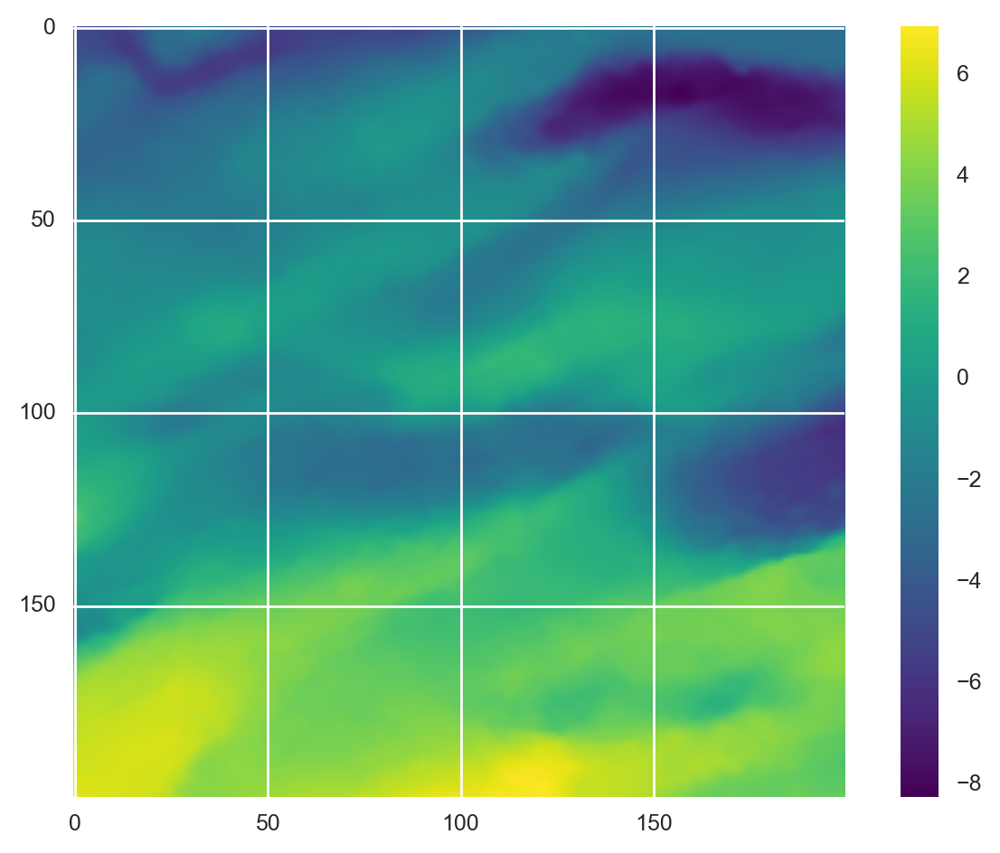

In [22]:
# Full resolution
imshow(a)
colorbar()

In [23]:
# Circular Masking
radius = 99.5

kernel = np.zeros((2*radius+1, 2*radius+1), dtype=bool)
y,x = np.ogrid[-radius:radius+1, -radius:radius+1]
mask = x**2 + y**2 <= radius**2
kernel[mask] = 1

/usr/local/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [24]:
# Circular Masking
radius2 = 70.5

kernel2 = np.zeros((2*radius2+1, 2*radius2+1), dtype=bool)
y2,x2 = np.ogrid[-radius2:radius2+1, -radius2:radius2+1]
mask2 = x2**2 + y2**2 <= radius2**2
kernel2[mask2] = 1

/usr/local/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [25]:
TL = ~kernel2
TL[71:] = 0
TL[:,71:] = 0

TR = ~kernel2
TR[71:] = 0
TR[:,:71] = 0

In [26]:
V_V[V_V > 0] = np.log(V_V[V_V > 0])

In [27]:
X, Y = np.meshgrid(r_[-49.75:50:.5],r_[-49.75:50:.5])

xCoords = X[kernel]
yCoords = Y[kernel]

pca = decomp.PCA()

gross_slope = np.zeros((tiles))

dataDCT = np.ones((tiles,5041),dtype=numpy.float32) # Reduced dimentionality!!!

reduced_data = np.ones((tiles,20164),dtype=numpy.float32)

for i in tqdm(range(tiles)):
    tile_ = data[i,:].reshape((200,200))
    orgin = np.vstack((X.ravel(),Y.ravel(),tile_.ravel()))
    zCoords = tile_[kernel]
    stacked = np.vstack((xCoords,yCoords,zCoords))
    
    pca.fit(stacked.T)
    # Sanity check to make sure third componet is always slope??
    gross_slope[i] = numpy.degrees(numpy.arccos(np.dot(np.abs(pca.components_[2]),
                                                       np.array([0,0,1]))))
    
    XY, Values = np.dot(orgin.T,pca.components_.T)[:,:2], np.dot(orgin.T,pca.components_.T)[:,2]
    
    normed = sp.interpolate.griddata(XY,Values,orgin.T[:,:2],'linear')
    
    reduced = normed.reshape(200,200)[29:-29,29:-29]

    
    if np.isnan(reduced).any():
        nanmask = np.isnan(reduced)
        filler = sp.interpolate.griddata(XY,Values,orgin.T[:,:2],'nearest')
        fill = filler.reshape(200,200)[29:-29,29:-29]
        reduced[nanmask] = fill[nanmask]
    
    
    
    circ = np.zeros((142,142))
    circ[kernel2] = reduced[kernel2]
    
    '''
    # Metadata for corners
    veloc = V_V.ravel()[VTree.query(coords[i].reshape(1,-1))[1].flatten()][0] 
    if veloc > -25:
        circ[TR] = veloc
    circ[TL] = np.radians(gross_slope[i])
    '''
    
    transformed = dct2(circ)
    #transformed = dct2(reduced)
    
    trans_duced = transformed[:71,:71]
    
    dataDCT[i,:5041] = trans_duced.ravel()
    
    # For comparision / sanity checking
    reduced_data[i,:] = circ.ravel() #reduced.ravel() # circ.ravel()
    
    if np.isnan(circ).any():
        #imshow(reduced_data[i].reshape(142,142))
        print(i)
    
    # Need to test for flips!!!

100%|██████████| 10000/10000 [1:06:39<00:00,  2.56it/s]


In [28]:
np.save('/Volumes/SciPy/data.npy',data)

In [29]:
np.save('/Volumes/SciPy/reduced_data.npy',reduced_data)

In [36]:
np.save('/Volumes/SciPy/dataDCT.npy', dataDCT)

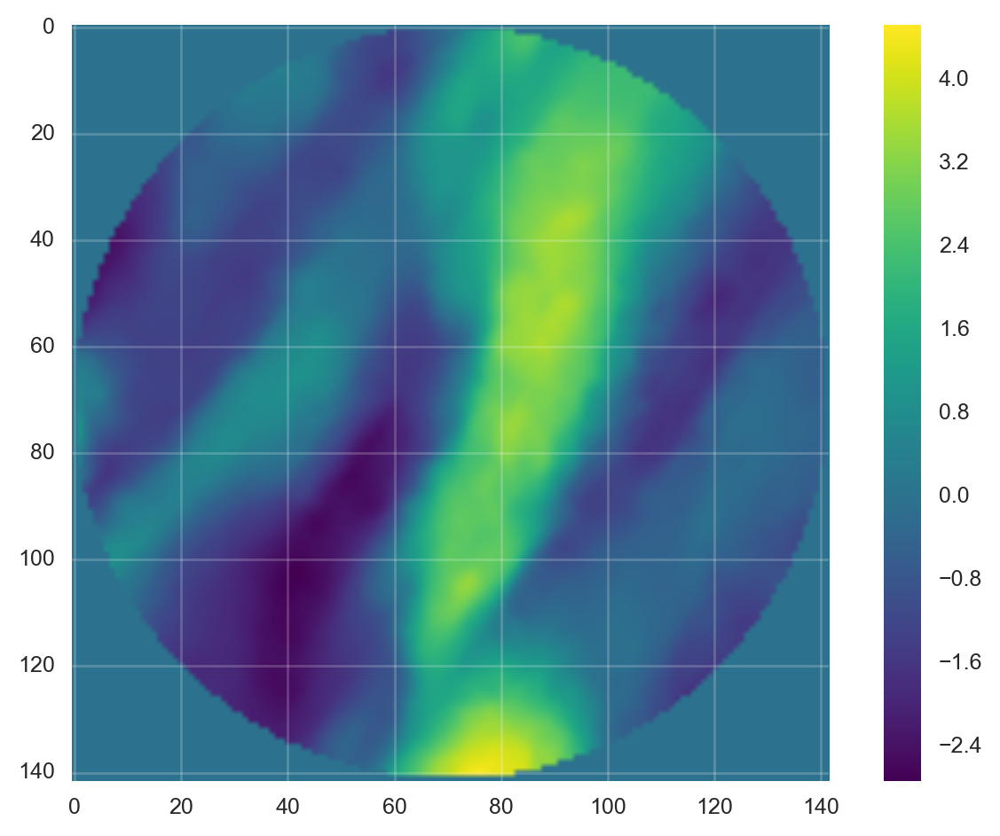

In [30]:
i = 3303 #5

f, axr = plt.subplots(1)
major_ticks = np.arange(0, 200, 20)                                              

axr.set_xticks(major_ticks)                                                                                                  
axr.set_yticks(major_ticks)                                                       
                                               
axr.grid(which='major', alpha=0.2)    
imgr = axr.imshow(reduced_data[i].reshape(142,142))
#divider = f.make_axes_locatable(ax)
#cax = divider.new_vertical(size="5%", pad=0.7, pack_start=True)

cbarr = plt.colorbar(imgr)

In [ ]:
axl.major_ticks = np.arange(0, 141, 20)                                              

axl.set_xticks(major_ticks)                                                                                                  
axl.set_yticks(major_ticks)                                                       
                                               
axl.grid(which='major', alpha=0.2) 
imgl = axl.imshow(data[i].reshape(200,200))
cbarl = f.colorbar(imgl, cax=axl)

show()

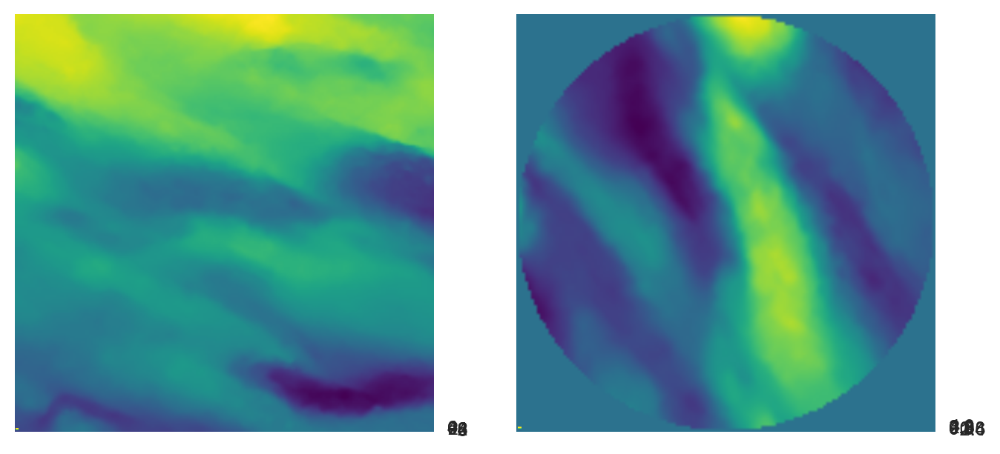

In [77]:
i = 3303 #5

f, (axl, axr) = plt.subplots(1)
major_ticks = np.arange(0, 200, 20)                                              

axr.set_xticks(major_ticks)                                                                                                  
axr.set_yticks(major_ticks)                                                       
                                               
axr.grid(which='major', alpha=0.2)    
imgr = axr.imshow(reduced_data[i].reshape(142,142))
#divider = f.make_axes_locatable(ax)
#cax = divider.new_vertical(size="5%", pad=0.7, pack_start=True)

cbarr = plt.colorbar(imgr, cax=axr)
#show()
#fig = plt.figure()
#ax = fig.add_subplot(1,1,1) 
axl.major_ticks = np.arange(0, 141, 20)                                              

axl.set_xticks(major_ticks)                                                                                                  
axl.set_yticks(major_ticks)                                                       
                                               
axl.grid(which='major', alpha=0.2) 
imgl = axl.imshow(data[i].reshape(200,200))
cbarl = f.colorbar(imgl, cax=axl)

show()

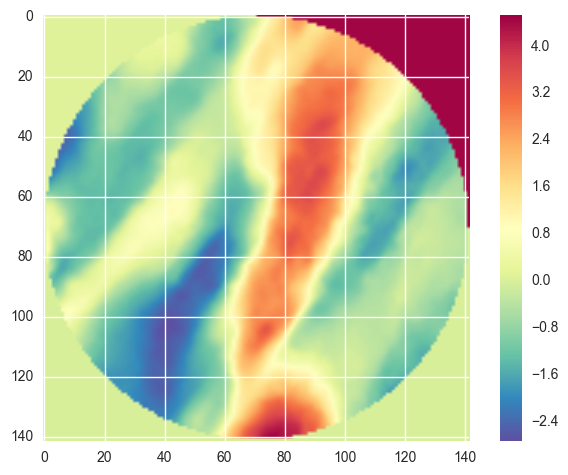

In [56]:
imshow(reduced_data[3303].reshape(142,142))
colorbar()

In [31]:
n_rows, n_columns = 200, 300
som2 = somoclu.Somoclu(n_columns, n_rows, compactsupport=False,  kerneltype=0, initialization="pca")
som2.train(data=dataDCT)

In [37]:
np.save('/Volumes/SciPy/SOM_bmus_SciPy.npy', som2.bmus)

In [38]:
np.save('/Volumes/SciPy/SOM_umatrix_SciPy.npy', som2.umatrix)

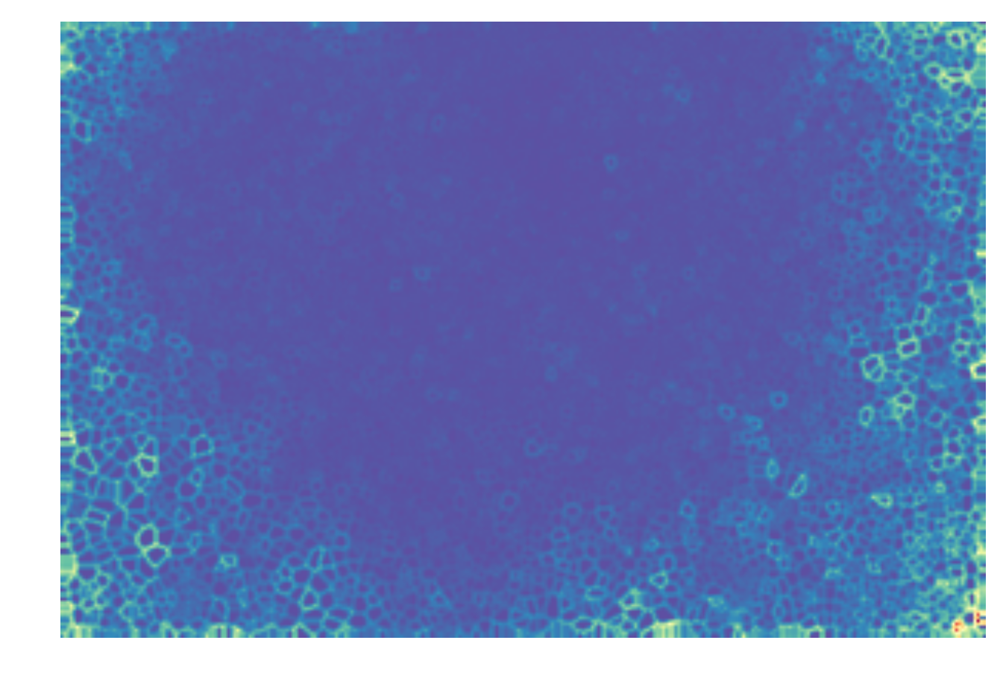

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.5/site-packages/matplotlib/pyplot.py'>

In [32]:
som2.view_umatrix()#bestmatches=True)

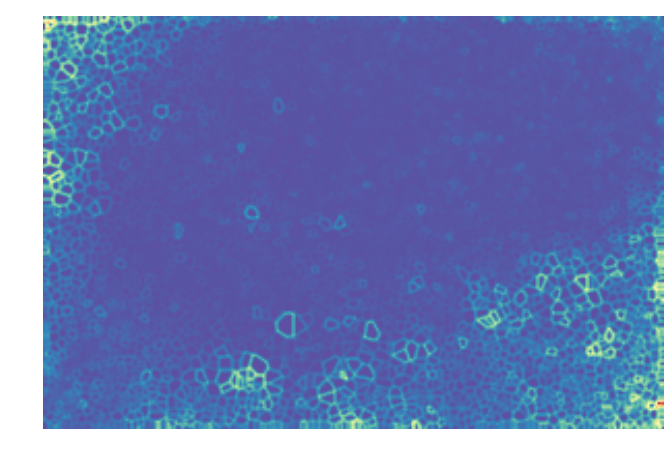

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.5/site-packages/matplotlib/pyplot.py'>

In [58]:
som2.view_umatrix()#bestmatches=True)

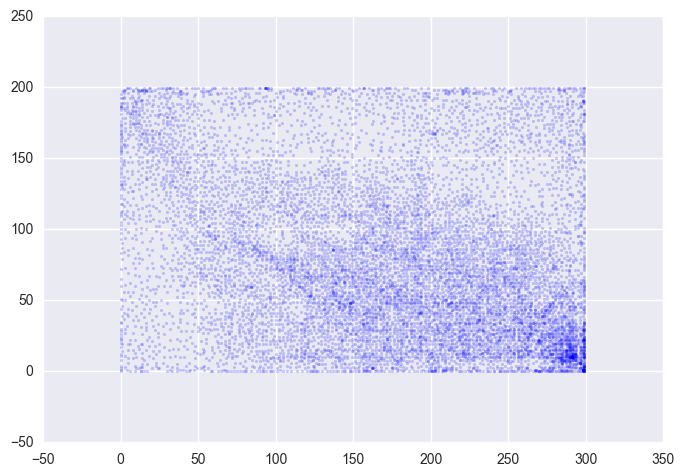

In [60]:
scatter(som2.bmus[:,0],som2.bmus[:,1],marker='.',alpha=0.2,linewidths=0.0)

In [62]:
tq  = nn.BallTree(som2.bmus,metric='cityblock')

In [65]:
tq.query(som2.bmus[3303],5)

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


(array([[ 0.,  2.,  3.,  3.,  3.]]), array([[3303, 5566, 6499, 2550, 1185]]))

array([225,   0], dtype=int32)

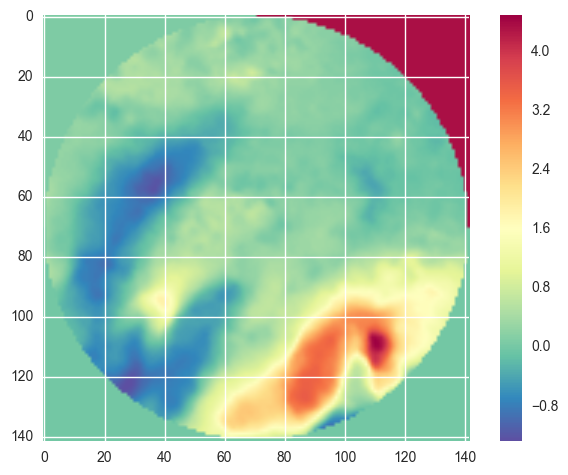

In [70]:
imshow(reduced_data[1185,:].reshape(142,142))
colorbar()
som2.bmus[1185]

In [236]:
n_rows, n_columns = 200, 300
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False,  kerneltype=0, initialization="pca")
som.train(data=dataDCT)

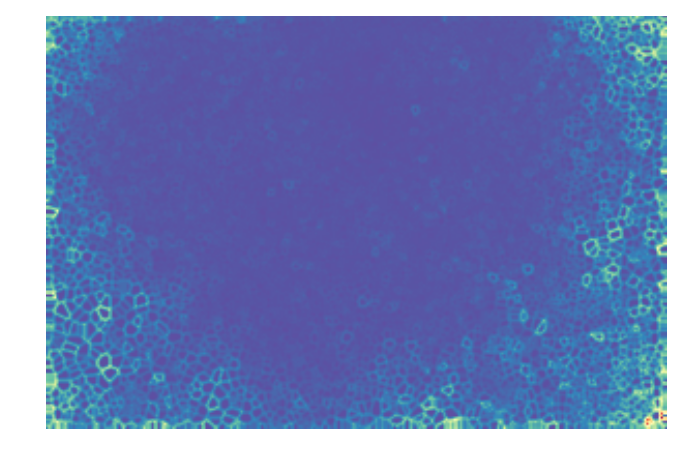

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.5/site-packages/matplotlib/pyplot.py'>

In [238]:
som.view_umatrix()#bestmatches=True)

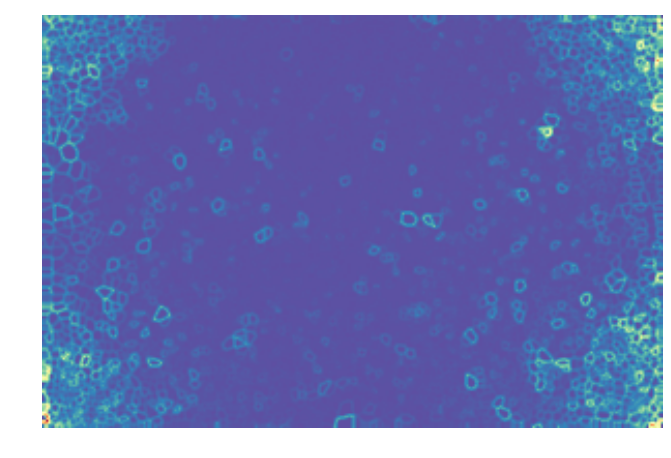

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.5/site-packages/matplotlib/pyplot.py'>

In [16]:
som.view_umatrix()#bestmatches=True)

In [240]:
X, Y = np.mgrid[0:301:1, 0:201:1]
positions = np.vstack([X.ravel(), Y.ravel()])
kernel = stats.gaussian_kde(som.bmus.T)
Z = np.reshape(kernel(positions).T, X.shape)

In [507]:
VTree.query(coords[1234])

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


(array([[ 73.21465674]]), array([[52002421]]))

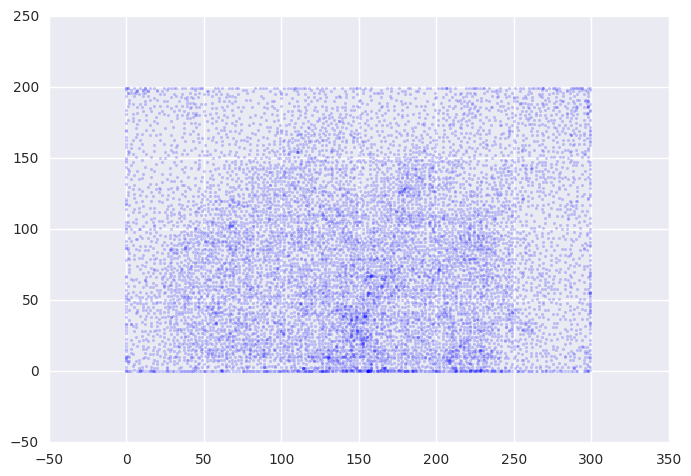

In [490]:
scatter(som.bmus[:,0],som.bmus[:,1],marker='.',alpha=0.2,linewidths=0.0)

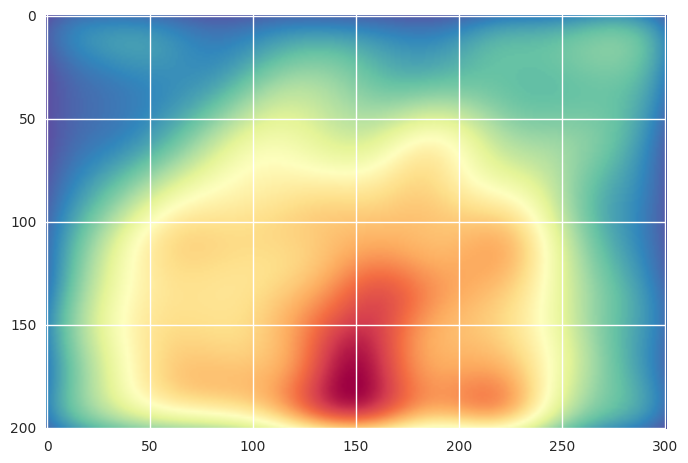

In [241]:
imshow(np.rot90(Z))
#colorbar()

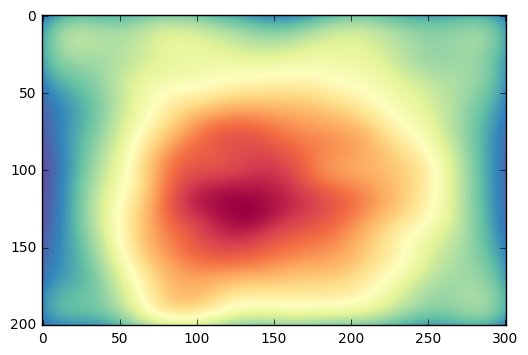

In [73]:
imshow(np.rot90(Z))
#colorbar()

In [30]:
som.bmus[134],som.bmus[1234]

(array([173,  60], dtype=int32), array([278, 198], dtype=int32))

array([241,   1], dtype=int32)

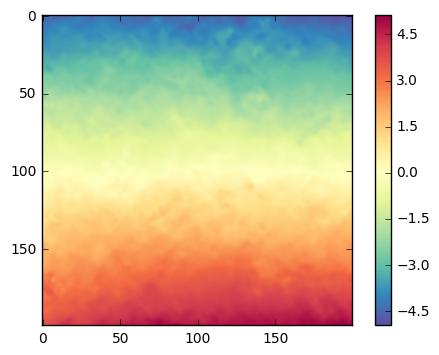

In [105]:
imshow(data[8284,:].reshape(200,200))
colorbar()
som.bmus[8284]

In [290]:
tq  = nn.BallTree(som.bmus,metric='cityblock')

In [258]:
tq.query(som.bmus[13],5)

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


(array([[ 0.,  1.,  1.,  2.,  2.]]), array([[  13, 6020, 1644, 7726, 5034]]))

1.2371559253323454

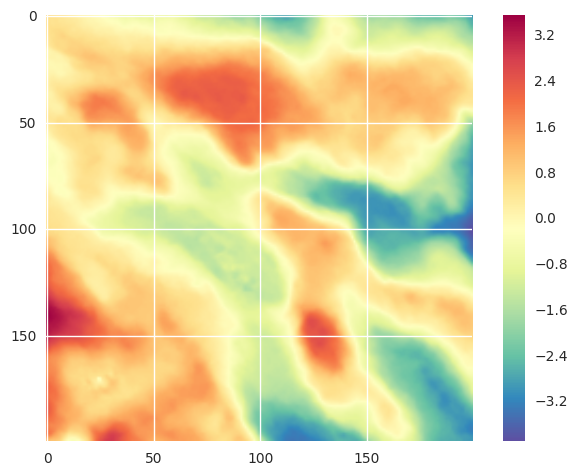

In [280]:
imshow(data[13,:].reshape(200,200))
colorbar()
som.bmus[13] #ref
gross_slope[13]

array([18,  0], dtype=int32)

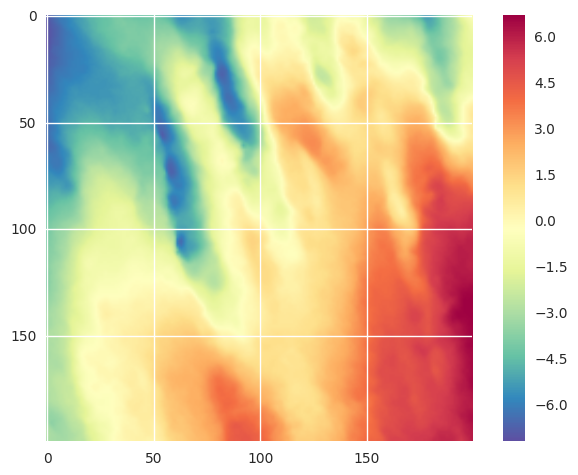

In [252]:
imshow(data[6020,:].reshape(200,200))
colorbar()
som.bmus[6020] #ref

array([18,  0], dtype=int32)

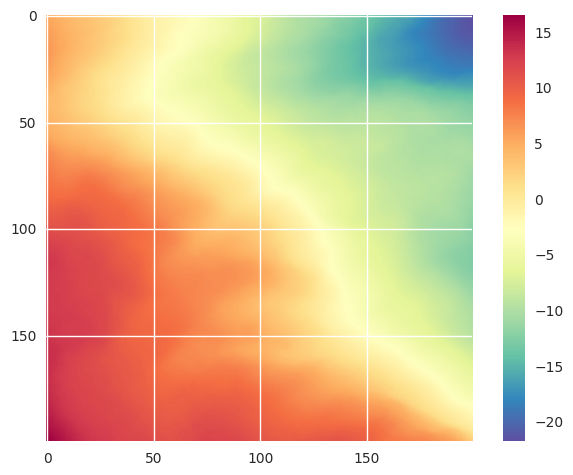

In [253]:
imshow(data[1644,:].reshape(200,200))
colorbar()
som.bmus[1644] #ref

array([18,  0], dtype=int32)

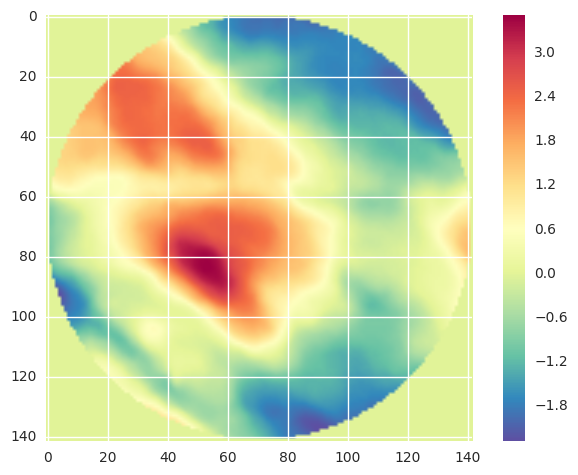

In [256]:
imshow(reduced_data[1644,:].reshape(142,142))
colorbar()
som.bmus[1644] #ref

array([19,  0], dtype=int32)

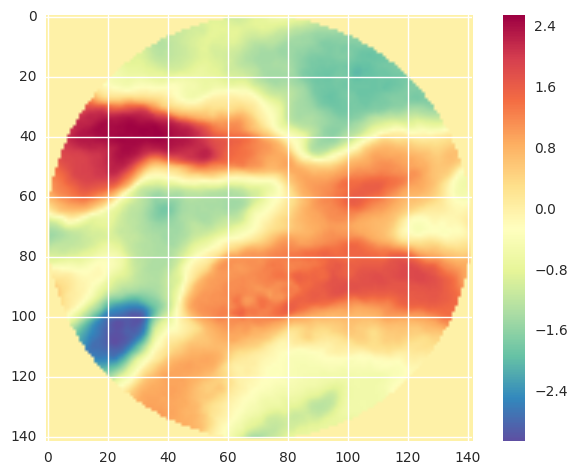

In [263]:
imshow(reduced_data[13,:].reshape(142,142))
colorbar()
som.bmus[13] #ref

array([18,  0], dtype=int32)

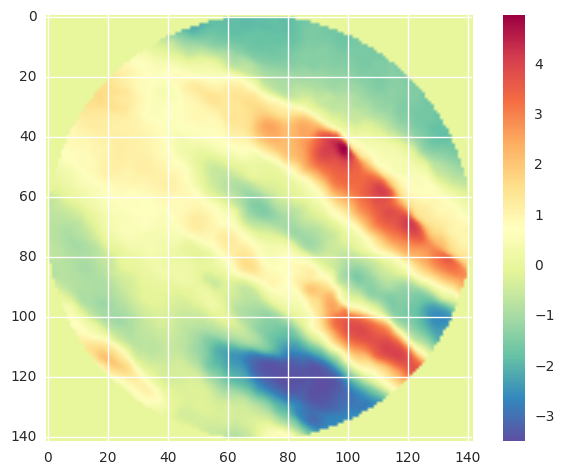

In [257]:
imshow(reduced_data[6020,:].reshape(142,142))
colorbar()
som.bmus[6020] #ref

4.7492103494114195

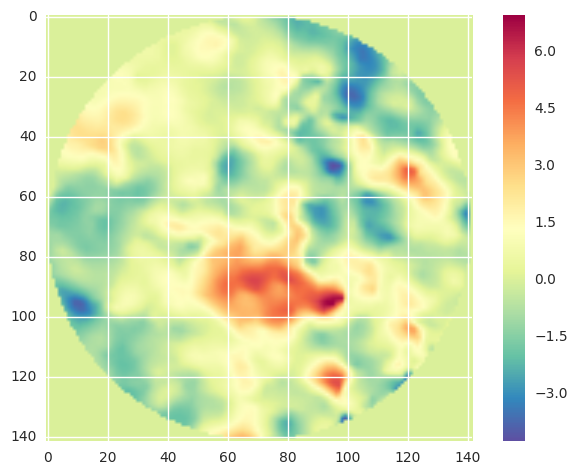

In [281]:
imshow(reduced_data[7726,:].reshape(142,142))
colorbar()
som.bmus[7726] #ref
gross_slope[7726]

array([21,  0], dtype=int32)

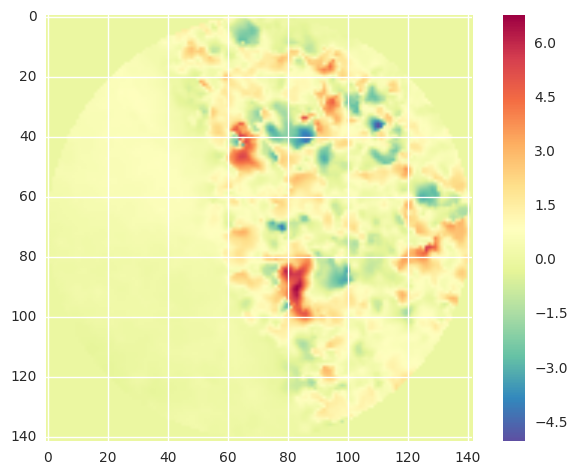

In [262]:
imshow(reduced_data[5034,:].reshape(142,142))
colorbar()
som.bmus[5034]

In [293]:
tq.query(som.bmus[642],5)

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


(array([[ 0.,  1.,  2.,  3.,  3.]]), array([[ 642, 5110, 8395, 8429, 4060]]))

array([262, 143], dtype=int32)

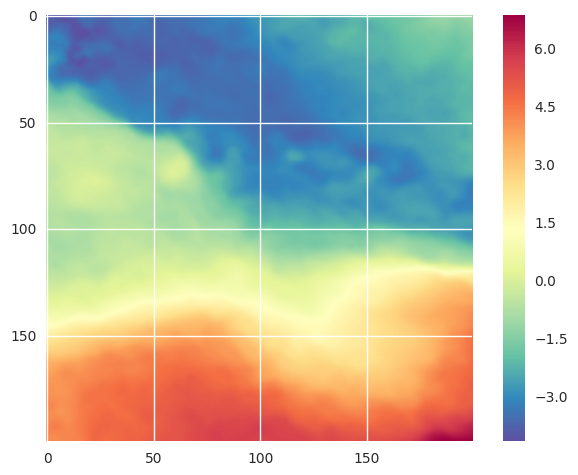

In [242]:
imshow(data[642,:].reshape(200,200))
colorbar()
som.bmus[642] #ref

array([262, 143], dtype=int32)

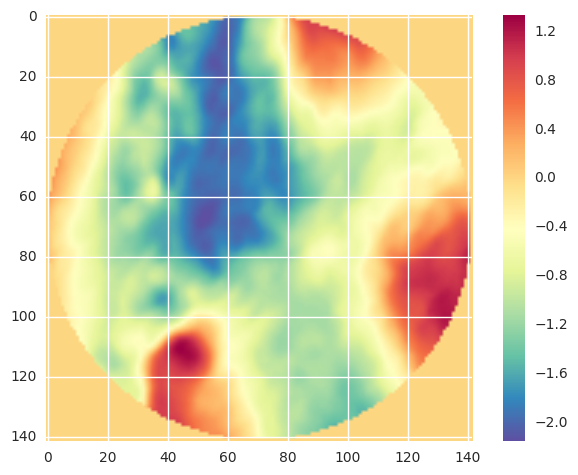

In [299]:
imshow(reduced_data[642,:].reshape(142,142))
colorbar()
som.bmus[642] #ref

array([261, 143], dtype=int32)

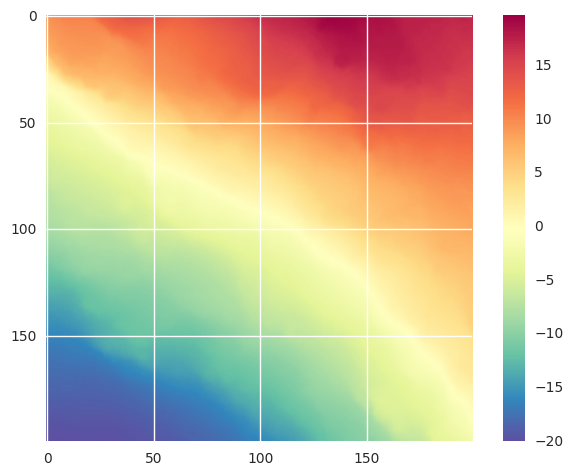

In [268]:
imshow(data[5110,:].reshape(200,200))
colorbar()
som.bmus[5110] #ref

array([261, 143], dtype=int32)

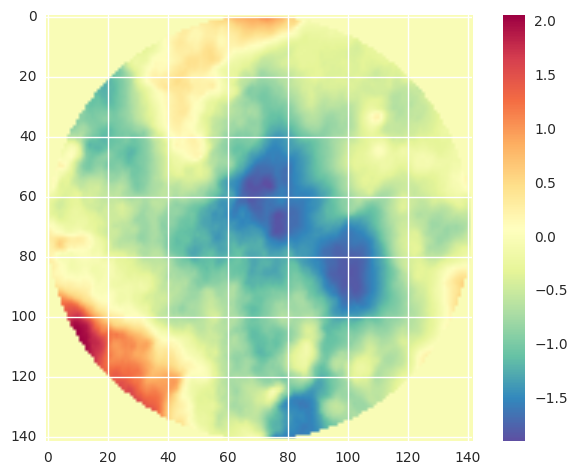

In [300]:
imshow(reduced_data[5110,:].reshape(142,142))
colorbar()
som.bmus[5110] #ref

array([261, 142], dtype=int32)

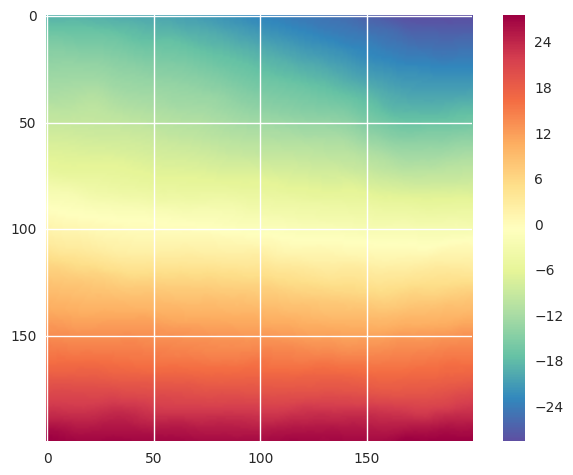

In [294]:
imshow(data[8395,:].reshape(200,200))
colorbar()
som.bmus[8395] # Distance 4
# [249,0]

array([261, 142], dtype=int32)

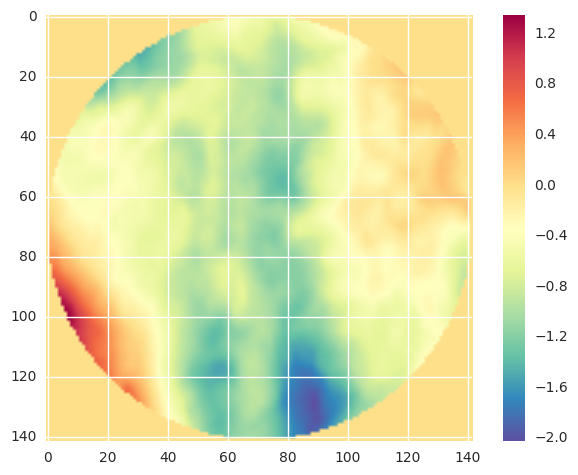

In [301]:
imshow(reduced_data[8395,:].reshape(142,142))
colorbar()
som.bmus[8395] # Distance 4
# [249,0]

array([264, 144], dtype=int32)

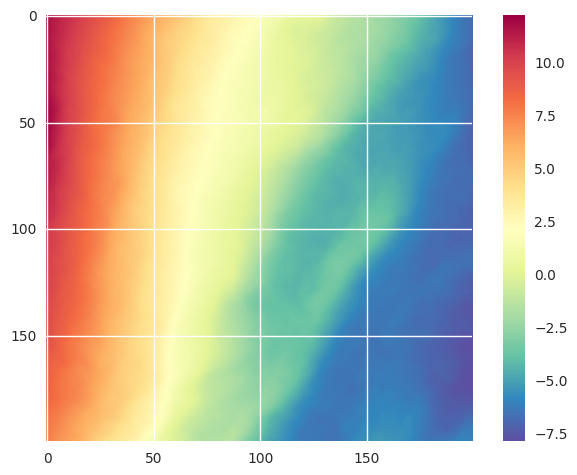

In [296]:
imshow(data[4060,:].reshape(200,200))
colorbar()
som.bmus[4060] #ref

array([264, 144], dtype=int32)

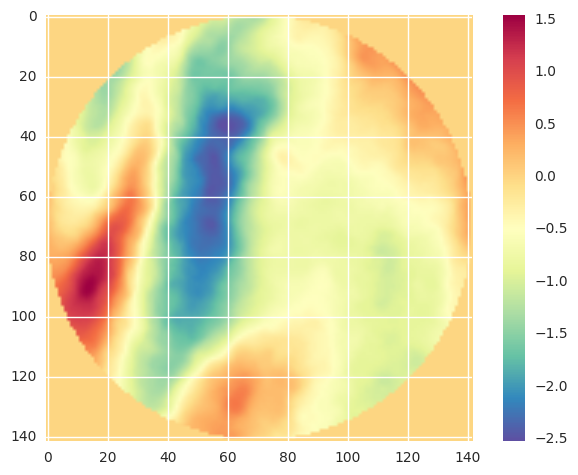

In [298]:
imshow(reduced_data[4060,:].reshape(142,142))
colorbar()
som.bmus[4060] #ref

array([261, 145], dtype=int32)

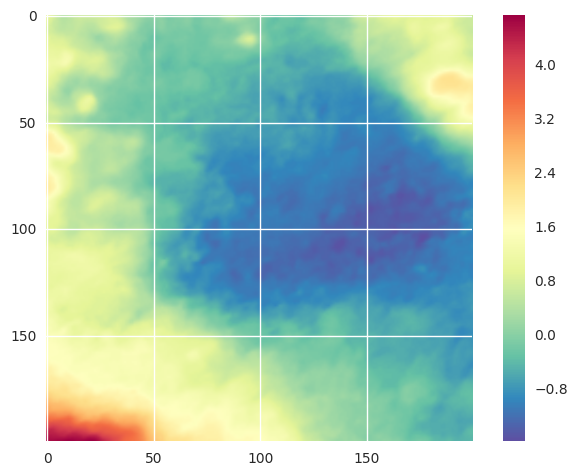

In [295]:
imshow(data[8429,:].reshape(200,200))
colorbar()
som.bmus[8429] # Distance 4
# [249,0]

array([261, 145], dtype=int32)

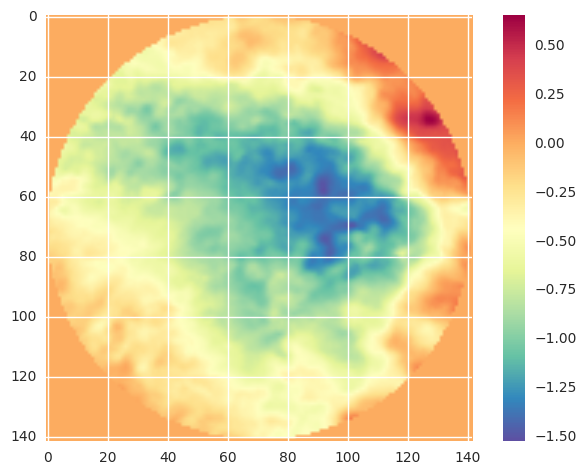

In [297]:
imshow(reduced_data[8429,:].reshape(142,142))
colorbar()
som.bmus[8429] # Distance 4
# [249,0]

array([261, 145], dtype=int32)

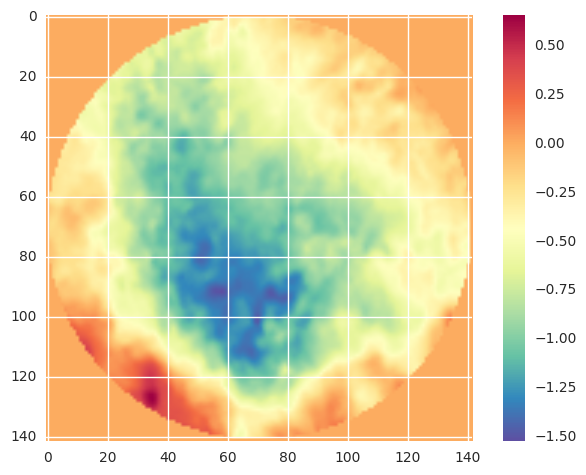

In [335]:
imshow(reduced_data[8429,:].reshape(142,142).T)
colorbar()
som.bmus[8429] # Distance 4
# [249,0]

In [291]:
tq.query(som.bmus[3303],10)

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


(array([[ 0.,  0.,  2.,  3.,  3.,  3.,  4.,  4.,  5.,  5.]]),
 array([[3303, 6315, 7412, 8260, 3292, 2282, 9830, 1505, 4341, 4273]]))

4.5140379896009204

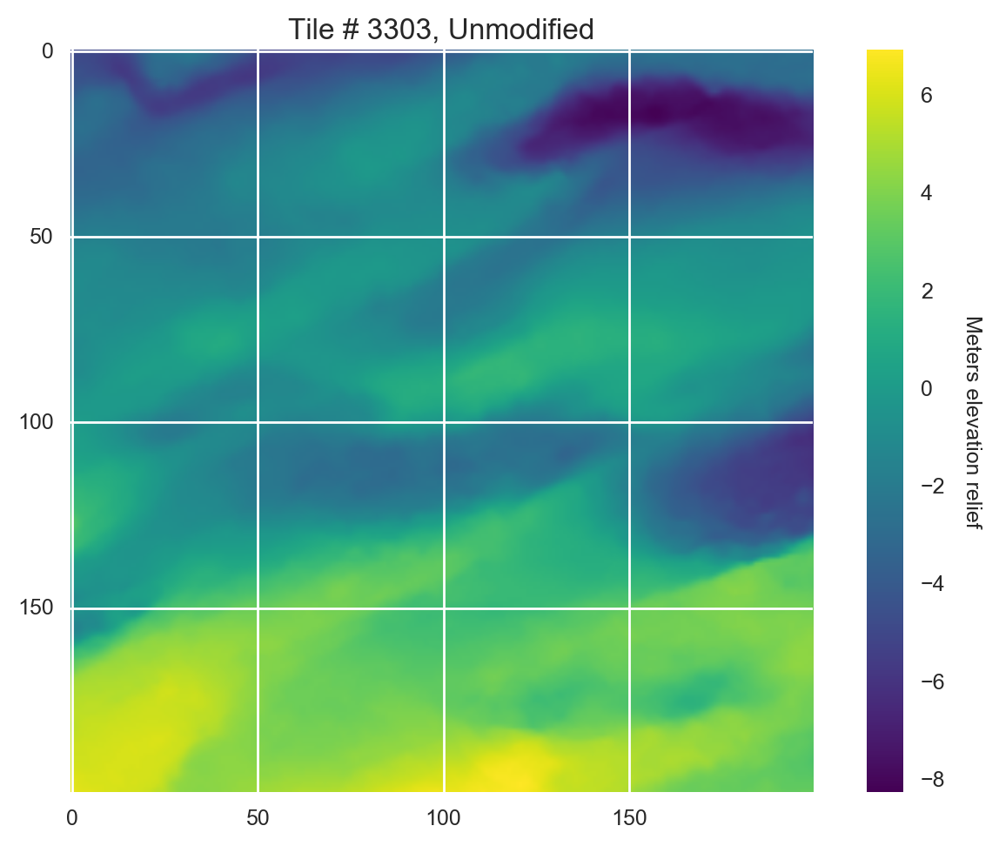

In [94]:
idx =3303
imshow(data[idx,:].reshape(200,200))
title("Tile # " + str(idx) + ", Unmodified")

cbar = colorbar()
cbar.set_label("Meters elevation relief", rotation=270)
cbar.ax.get_yaxis().labelpad=15
#som.bmus[3303] # Distance 4
# [249,0]
gross_slope[idx]

4.5140379896009204

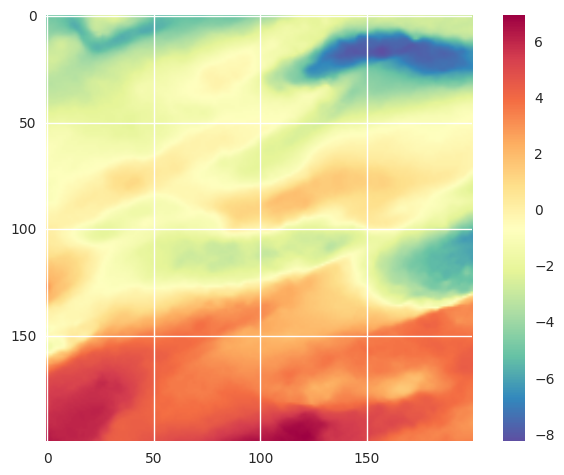

In [340]:
imshow(data[3303,:].reshape(200,200))
colorbar()
som.bmus[3303] # Distance 4
# [249,0]
gross_slope[3303]

2.4659358005609682

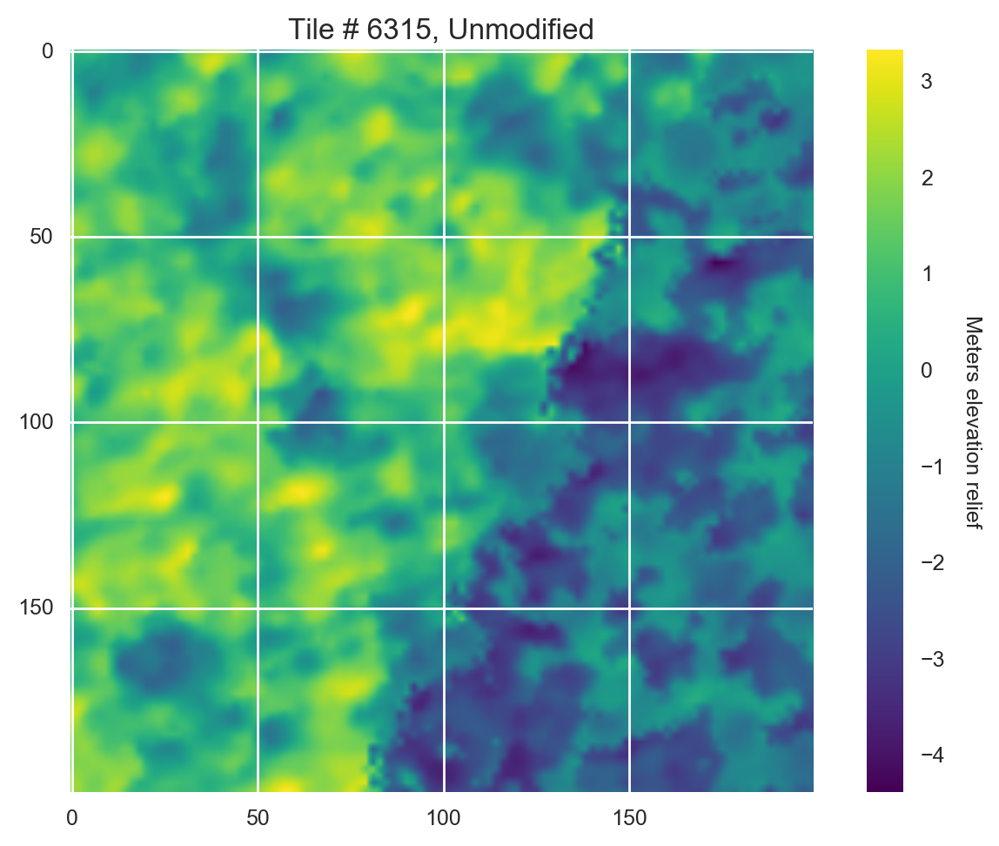

In [95]:
idx = 6315
imshow(data[idx,:].reshape(200,200))
title("Tile # " + str(idx) + ", Unmodified")

cbar = colorbar()
cbar.set_label("Meters elevation relief", rotation=270)
cbar.ax.get_yaxis().labelpad=15
#som.bmus[3303] # Distance 4
# [249,0]
gross_slope[idx]

array([268,   0], dtype=int32)

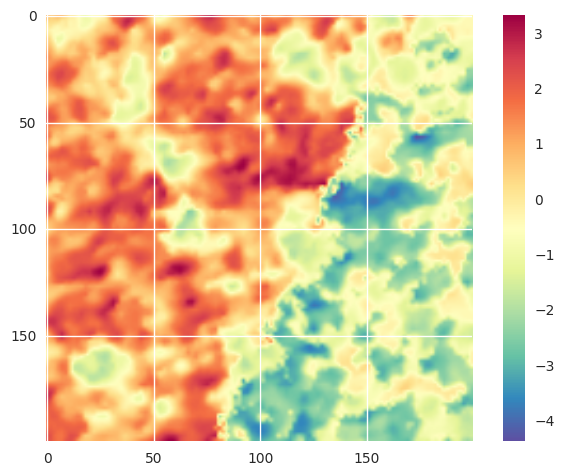

In [277]:
imshow(data[6315,:].reshape(200,200))
colorbar()
som.bmus[6315] # Distance 4
# [249,0]

1.5357701804429222

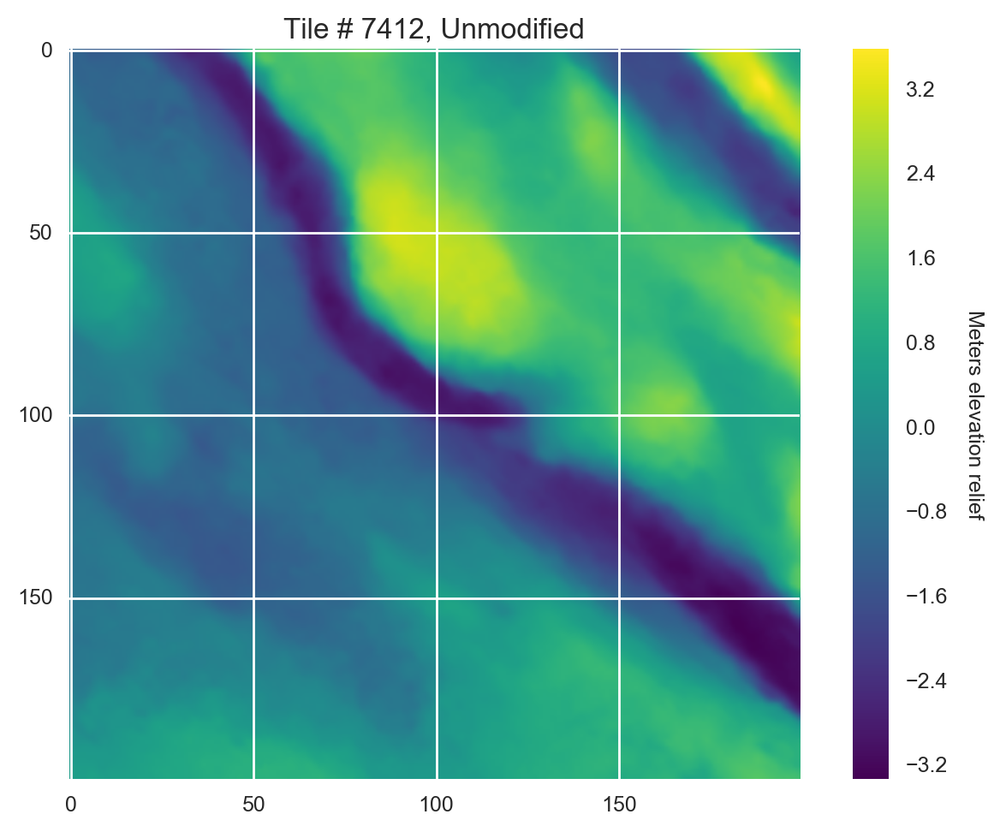

In [96]:
idx =7412
imshow(data[idx,:].reshape(200,200))
title("Tile # " + str(idx) + ", Unmodified")

cbar = colorbar()
cbar.set_label("Meters elevation relief", rotation=270)
cbar.ax.get_yaxis().labelpad=15
#som.bmus[3303] # Distance 4
# [249,0]
gross_slope[idx]

1.5357701804429222

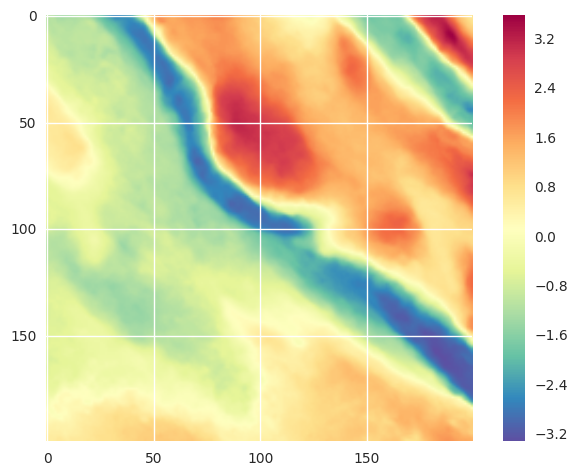

In [339]:
imshow(data[7412,:].reshape(200,200))
colorbar()
som.bmus[7412] # Distance 4
# [249,0]
gross_slope[7412]

In [ ]:
idx =3303
imshow(data[idx,:].reshape(200,200))
title("Tile # " + str(idx) + ", Unmodified")

cbar = colorbar()
cbar.set_label("Meters elevation relief", rotation=270)
cbar.ax.get_yaxis().labelpad=15
#som.bmus[3303] # Distance 4
# [249,0]
gross_slope[idx]

3.2699028020502308

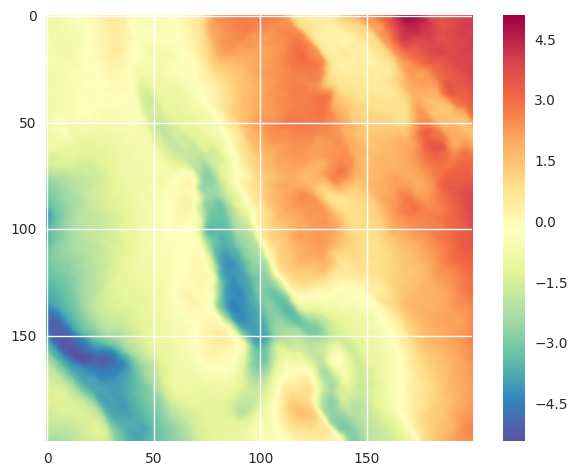

In [338]:
imshow(data[8260,:].reshape(200,200))
colorbar()
som.bmus[8260] # Distance 4
# [249,0]
gross_slope[8260]

1.3581148244075518

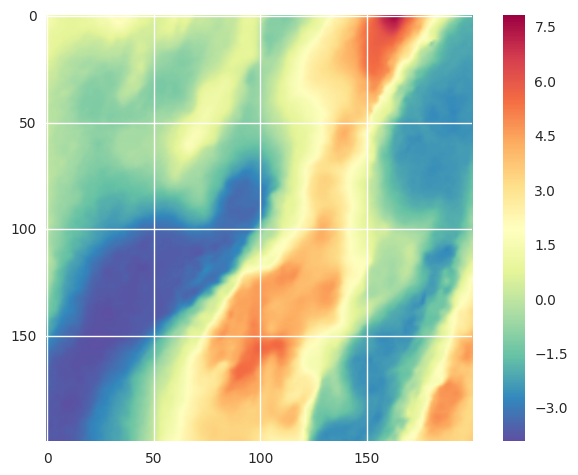

In [337]:
imshow(data[3292,:].reshape(200,200))
colorbar()
som.bmus[3292] # Distance 4
# [249,0]
gross_slope[3292]

4.5140379896009204

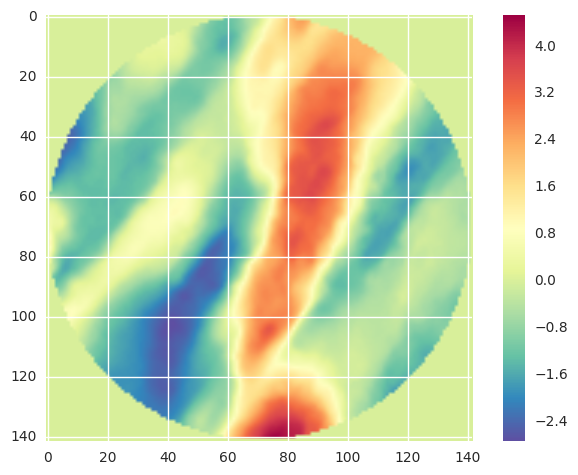

In [336]:
imshow(reduced_data[3303,:].reshape(142,142))
colorbar()
som.bmus[3303] # Distance 4
# [249,0]
gross_slope[3303]

array([268,   0], dtype=int32)

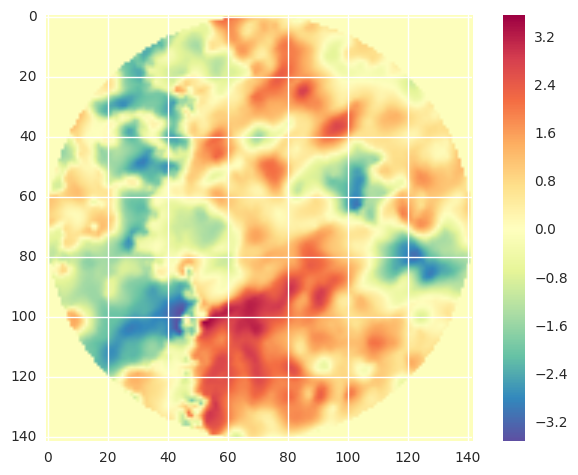

In [284]:
imshow(reduced_data[6315,:].reshape(142,142))
colorbar()
som.bmus[6315] # Distance 4
# [249,0]

array([270,   0], dtype=int32)

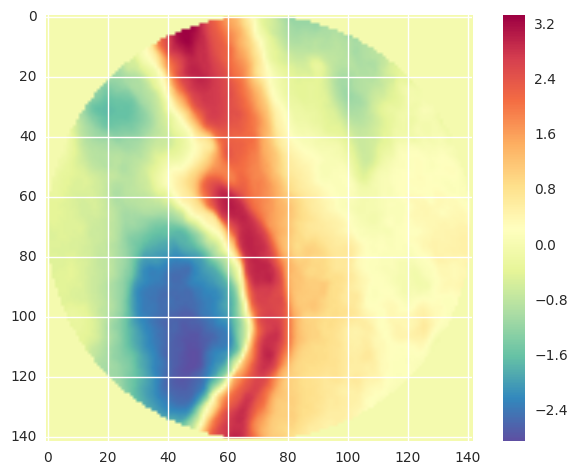

In [303]:
imshow(reduced_data[7412,:].reshape(142,142))
colorbar()
som.bmus[7412] # Distance 4
# [249,0]

array([267,   2], dtype=int32)

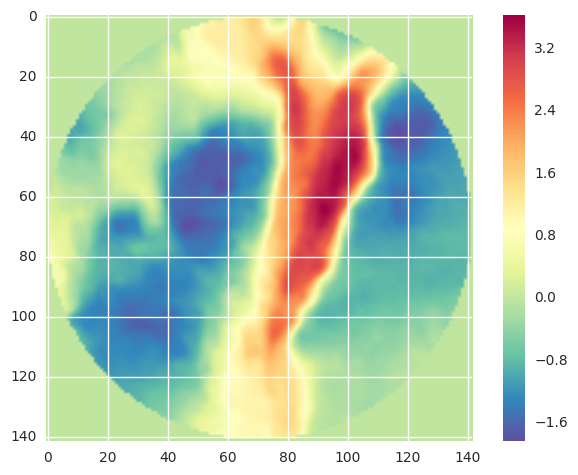

In [306]:
imshow(reduced_data[8260,:].reshape(142,142))
colorbar()
som.bmus[8260] # Distance 4
# [249,0]

array([265,   0], dtype=int32)

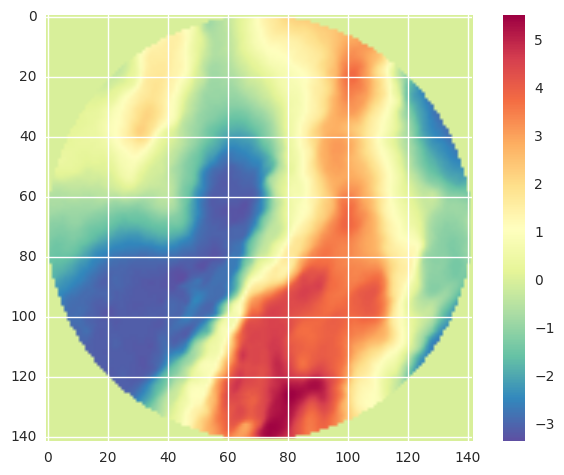

In [307]:
imshow(reduced_data[3292,:].reshape(142,142))
colorbar()
som.bmus[3292] # Distance 4
# [249,0]

array([271,   0], dtype=int32)

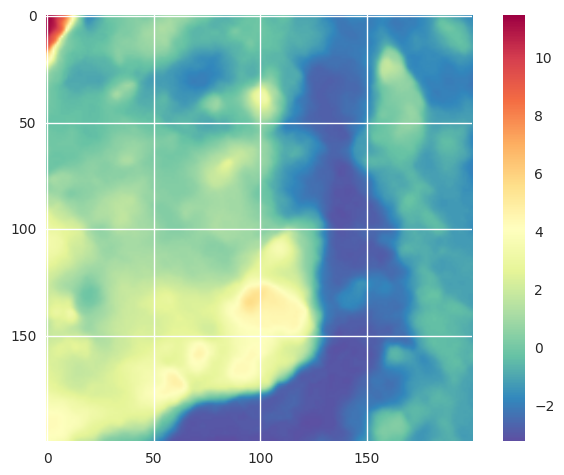

In [288]:
imshow(data[2282,:].reshape(200,200))
colorbar()
som.bmus[2282] # Distance 4
# [249,0]

array([264,   0], dtype=int32)

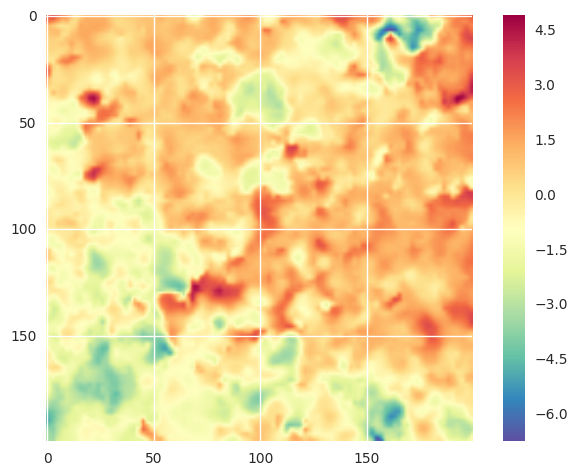

In [292]:
imshow(data[9830,:].reshape(200,200))
colorbar()
som.bmus[9830] # Distance 4
# [249,0]

In [271]:
tq.query(som.bmus[7046],5)

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


(array([[ 0.        ,  2.82842712,  3.16227766,  4.24264069,  5.38516481]]),
 array([[7046, 4075, 9429, 5974,  132]]))

array([ 29, 193], dtype=int32)

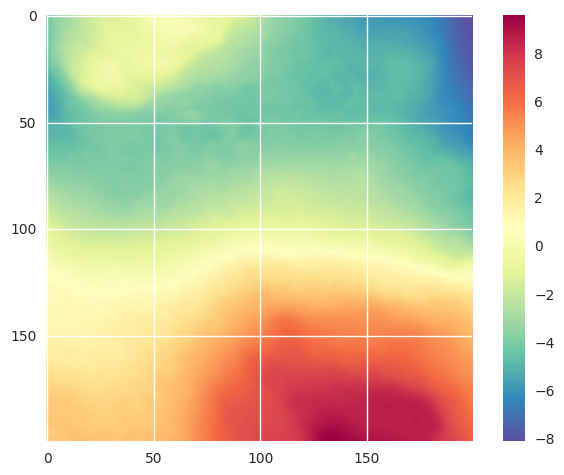

In [243]:
imshow(data[7046,:].reshape(200,200))
colorbar()
som.bmus[7046] # Distance 4
# [249,0]

array([ 31, 195], dtype=int32)

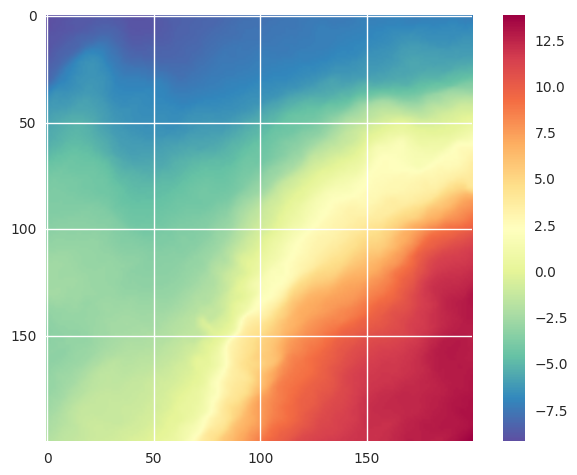

In [273]:
imshow(data[4075,:].reshape(200,200))
colorbar()
som.bmus[4075] # Distance 4
# [249,0]

array([ 32, 194], dtype=int32)

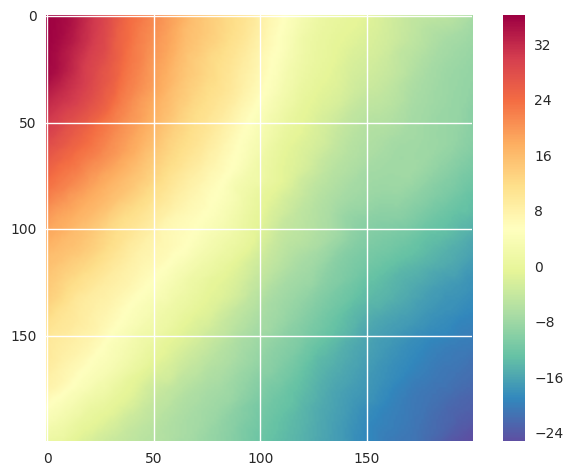

In [274]:
imshow(data[9429,:].reshape(200,200))
colorbar()
som.bmus[9429] # Distance 4
# [249,0]

array([236, 136], dtype=int32)

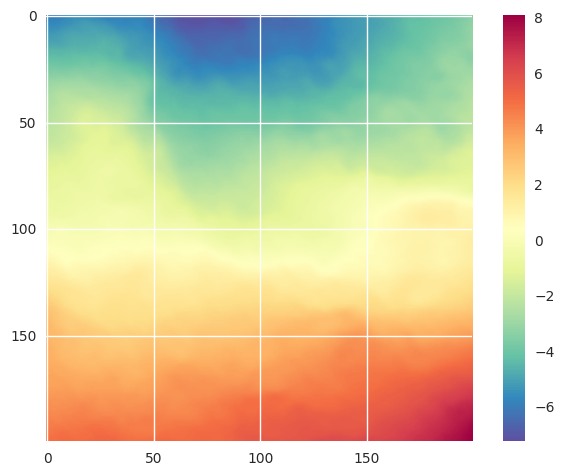

In [244]:
imshow(data[6022,:].reshape(200,200))
colorbar()
som.bmus[6022] #distance 2
# [247,0]

array([266, 130], dtype=int32)

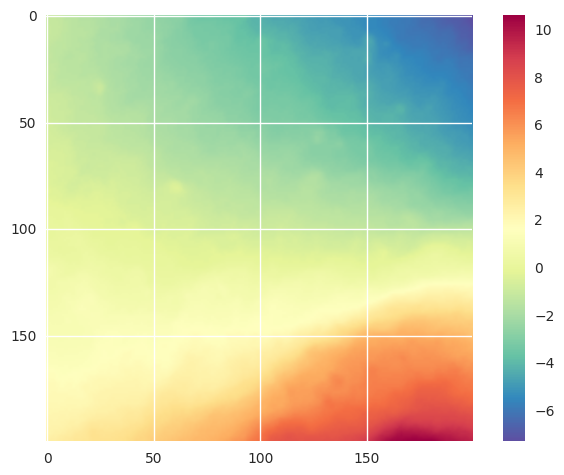

In [245]:
imshow(data[3009,:].reshape(200,200))
colorbar()
som.bmus[3009] #distance 3
# [243, 1]

array([  6, 196], dtype=int32)

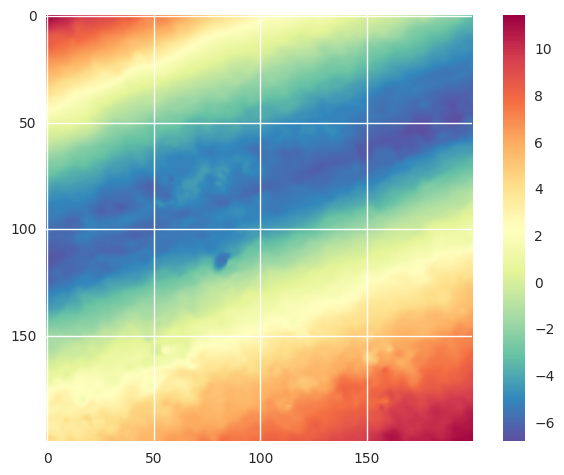

In [246]:
imshow(data[3868,:].reshape(200,200))
colorbar()
som.bmus[3868] # Distance 5
# [240, 0]

array([245,   0], dtype=int32)

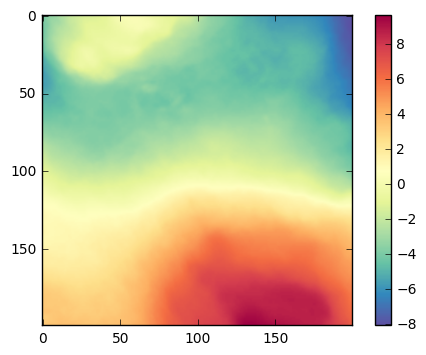

In [165]:
imshow(data[7046,:].reshape(200,200))
colorbar()
som.bmus[642] # Distance 4
# [249,0]

array([245,   0], dtype=int32)

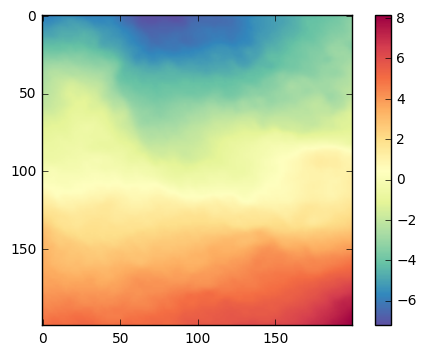

In [163]:
imshow(data[6022,:].reshape(200,200))
colorbar()
som.bmus[642] #distance 2
# [247,0]

array([245,   0], dtype=int32)

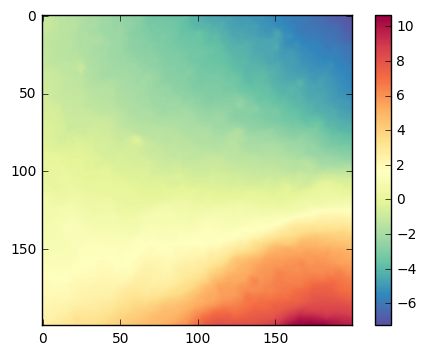

In [164]:
imshow(data[3009,:].reshape(200,200))
colorbar()
som.bmus[642] #distance 3
# [243, 1]

array([245,   0], dtype=int32)

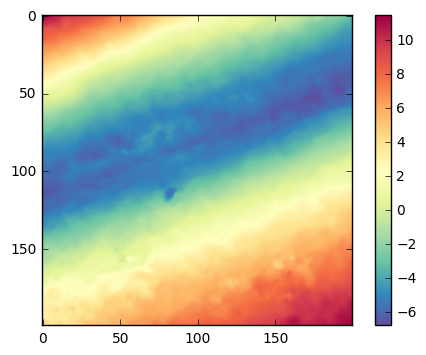

In [171]:
imshow(data[3868,:].reshape(200,200))
colorbar()
som.bmus[642] # Distance 5
# [240, 0]